<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Imports" data-toc-modified-id="Imports-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Imports</a></span></li><li><span><a href="#Define-your-start-and-end-image" data-toc-modified-id="Define-your-start-and-end-image-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Define your start and end image</a></span><ul class="toc-item"><li><span><a href="#Two-words..." data-toc-modified-id="Two-words...-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Two words...</a></span></li><li><span><a href="#From-a-list-of-words" data-toc-modified-id="From-a-list-of-words-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>From a list of words</a></span></li><li><span><a href="#From-files" data-toc-modified-id="From-files-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>From files</a></span></li></ul></li><li><span><a href="#an-image-and-some-text" data-toc-modified-id="an-image-and-some-text-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>an image and some text</a></span></li><li><span><a href="#Just-trying-a-bunch-of-stuff-out" data-toc-modified-id="Just-trying-a-bunch-of-stuff-out-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Just trying a bunch of stuff out</a></span></li><li><span><a href="#Use-to-filter-image" data-toc-modified-id="Use-to-filter-image-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Use to filter image</a></span><ul class="toc-item"><li><span><a href="#Choose-a-filter" data-toc-modified-id="Choose-a-filter-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Choose a filter</a></span></li></ul></li><li><span><a href="#Blending-with-a-background" data-toc-modified-id="Blending-with-a-background-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Blending with a background</a></span><ul class="toc-item"><li><span><a href="#Where-you-need-to-pad-one-of-the-images-to-match-sizes" data-toc-modified-id="Where-you-need-to-pad-one-of-the-images-to-match-sizes-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Where you need to pad one of the images to match sizes</a></span><ul class="toc-item"><li><span><a href="#Choose-foreground" data-toc-modified-id="Choose-foreground-6.1.1"><span class="toc-item-num">6.1.1&nbsp;&nbsp;</span>Choose foreground</a></span></li><li><span><a href="#Choose-a-background" data-toc-modified-id="Choose-a-background-6.1.2"><span class="toc-item-num">6.1.2&nbsp;&nbsp;</span>Choose a background</a></span></li><li><span><a href="#pad-it" data-toc-modified-id="pad-it-6.1.3"><span class="toc-item-num">6.1.3&nbsp;&nbsp;</span>pad it</a></span></li><li><span><a href="#Blend-it" data-toc-modified-id="Blend-it-6.1.4"><span class="toc-item-num">6.1.4&nbsp;&nbsp;</span>Blend it</a></span></li></ul></li><li><span><a href="#Where-you-need-to-resize-an-image" data-toc-modified-id="Where-you-need-to-resize-an-image-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Where you need to resize an image</a></span><ul class="toc-item"><li><span><a href="#Choose-foreground" data-toc-modified-id="Choose-foreground-6.2.1"><span class="toc-item-num">6.2.1&nbsp;&nbsp;</span>Choose foreground</a></span></li><li><span><a href="#Choose-a-background" data-toc-modified-id="Choose-a-background-6.2.2"><span class="toc-item-num">6.2.2&nbsp;&nbsp;</span>Choose a background</a></span></li><li><span><a href="#Blend-it" data-toc-modified-id="Blend-it-6.2.3"><span class="toc-item-num">6.2.3&nbsp;&nbsp;</span>Blend it</a></span></li></ul></li></ul></li><li><span><a href="#Scrap" data-toc-modified-id="Scrap-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Scrap</a></span></li></ul></div>

I'm calling these [Parquet deformations](https://www.theguardian.com/artanddesign/alexs-adventures-in-numberland/2014/sep/09/crazy-paving-the-twisted-world-of-parquet-deformations#:~:text=In%20the%201960s%20an%20American,the%20regularity%20of%20the%20tiling.) but purest would lynch me. 

Really, I just wanted to transform one word into another word, gradually, as I've seen in some of [Escher's](https://en.wikipedia.org/wiki/M._C._Escher) work, so I looked it up, and saw that it's called parquet deformations. The math looked enticing, but I had no time for that, so I did the first way I could think of: Mapping pixels to pixels (in some fashion -- but nearest neighbors is the method that yields nicest results, under the pixel-level restriction). 

Of course, this can be applied to any image (that will be transformed to B/W (not even gray -- I mean actual B/W), and there's several ways you can perform the parquet (I like the gif rendering). 

The main function (exposed as a script) is `mk_deformation_image`. All you need is to specify two images (or words). If you want, of course, you can specify:
- `n_steps`: Number of steps from start to end image
- `save_to_file`: path to file to save too (if not given, will just return the image object)
- `kind`: 'gif', 'horizontal_stack', or 'vertical_stack'
- `coordinate_mapping_maker`: A function that will return the mapping between start and end. 
This function should return a pair (`from_coord`, `to_coord`) of aligned matrices whose 2 columns are the the 
`(x, y)` coordinates, and the rows represent aligned positions that should be mapped. 


# Imports

In [1]:
from sklearn.neighbors import NearestNeighbors
from sklearn.datasets import load_sample_image
from PIL import Image, ImageDraw, ImageFont, ImageOps
from skimage import data
try:
    from oscrap.tw.parquet_deformations import *
except:
    from parquet_deformations import *
    
    
def add_margin(pil_img, top, right, bottom, left, color):
    width, height = pil_img.size
    new_width = width + right + left
    new_height = height + top + bottom
    result = Image.new(pil_img.mode, (new_width, new_height), color)
    result.paste(pil_img, (left, top))
    return result

In [3]:
import itertools

list(itertools.islice(itertools.cycle([1,2,3]), 10))

[1, 2, 3, 1, 2, 3, 1, 2, 3, 1]

# Define your start and end image

## Two words...

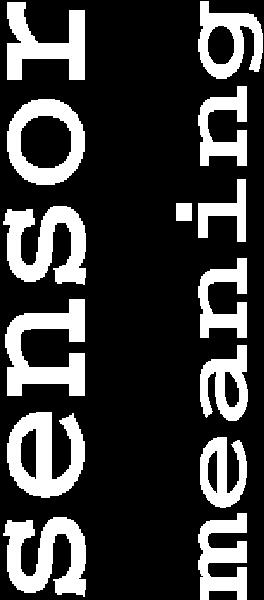

In [4]:
fit_to_size = 400
start_im = image_of_text('sensor').rotate(90, expand=1)
end_im = image_of_text('meaning').rotate(90, expand=1)
start_and_end_image(start_im, end_im)

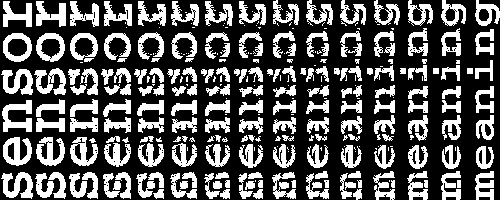

In [5]:
im = mk_deformation_image(start_im, end_im, 15, kind='h').resize((500,200))
im

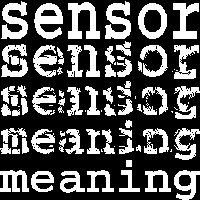

In [8]:
im = mk_deformation_image(start_im.transpose(4), end_im.transpose(4), 5, kind='v').resize((200,200))
im

In [12]:
f = 'sensor_meaning_knn.gif'
mk_deformation_image(start_im.transpose(4), end_im.transpose(4), n_steps=20, save_to_file=f)
display_gif(f)

In [13]:
f = 'sensor_meaning_scan.gif'
mk_deformation_image(start_im.transpose(4), end_im.transpose(4), n_steps=20, save_to_file=f, 
                     coordinate_mapping_maker='scan')
display_gif(f)

In [14]:
f = 'sensor_meaning_random.gif'
mk_deformation_image(start_im.transpose(4), end_im.transpose(4), n_steps=20, save_to_file=f, 
                     coordinate_mapping_maker='random')
display_gif(f)

## From a list of words

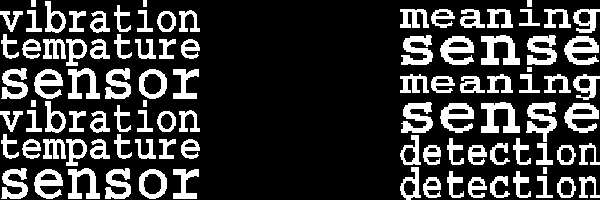

In [15]:
start_words = ['sensor', 'vibration', 'tempature']
end_words = ['sense', 'meaning', 'detection']
start_im, end_im = make_start_and_end_images_with_words(
    start_words, end_words, perm=True, repeat=2, size=150)
start_and_end_image(start_im, end_im).resize((600, 200))

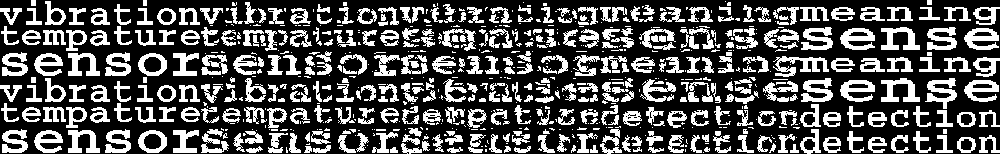

In [16]:
im = mk_deformation_image(start_im, end_im, 5)
im

In [17]:
f = 'bunch_of_words.gif'
mk_deformation_image(start_im, end_im, n_steps=20, save_to_file=f)
display_gif(f)

## From files

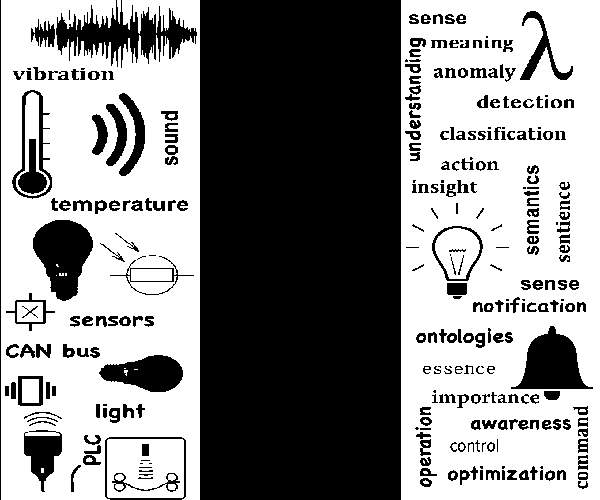

In [10]:
start_im = Image.open('sensor_strip_01.png')
end_im = Image.open('sense_strip_01.png')
start_and_end_image(start_im.resize((200, 500)), end_im.resize((200, 500)))

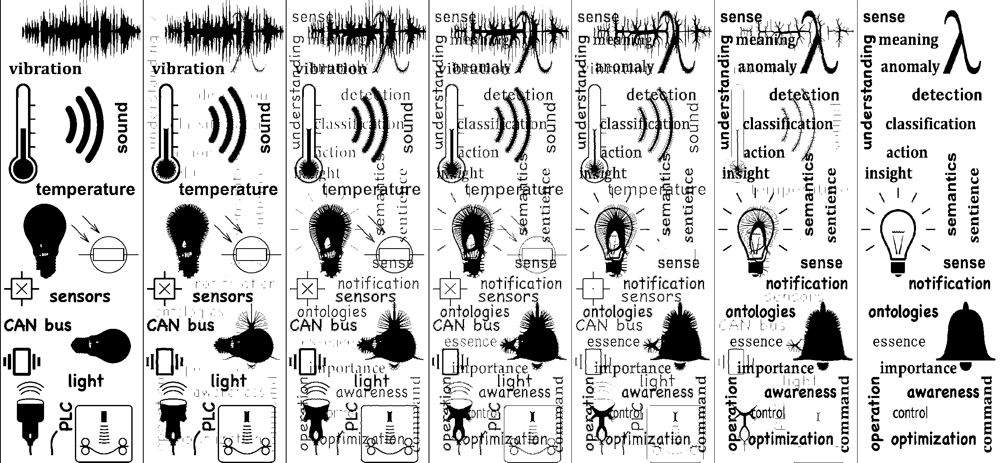

In [40]:
im = mk_deformation_image(start_im, end_im, 7)
im

In [41]:
f = 'medley.gif'
mk_deformation_image(start_im, end_im, n_steps=20, save_to_file=f)
display_gif(f)

In [11]:
mk_deformation_image(start_im, end_im, n_steps=20, save_to_file=f, coordinate_mapping_maker='scan')
display_gif(f)

# an image and some text

In [26]:
start_im = 'img/waveform_01.png'  # will first look for a file, and if not consider as text
end_im = 'makes sense'

mk_gif_of_deformations(start_im, end_im, n_steps=20, 
                               save_to_file='image_and_text.gif')
display_gif('image_and_text.gif')  

# Just trying a bunch of stuff out

In [92]:
end_im = image_of_text('sense')

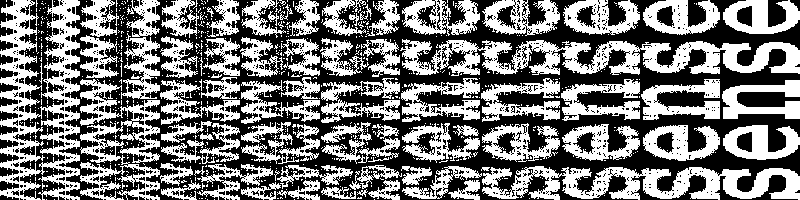

In [93]:
start_im = Image.open('img/vibration_02.jpg')
start_im = boolean_matrix_of_image(start_im, cutoff=0.65)
im = mk_deformation_image(start_im, end_im, n_steps=10, kind='vertical')
im.transpose(2).resize((800, 200))

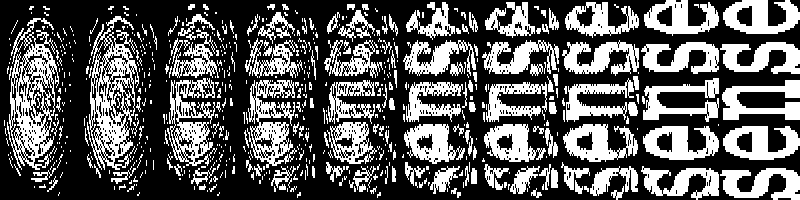

In [94]:
start_im = Image.open('img/vibration_03.jpg').resize((100, 300))
start_im = boolean_matrix_of_image(start_im, cutoff=0.4)
im = mk_deformation_image(start_im, end_im, n_steps=10, kind='vertical')
im.transpose(2).resize((800, 200))

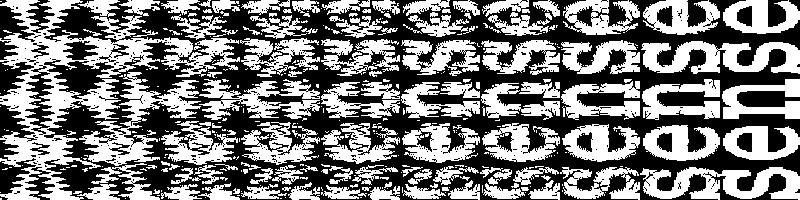

In [95]:
start_im = Image.open('img/vibration_04.jpeg')
im = mk_deformation_image(start_im, end_im, n_steps=10, kind='vertical')
im.transpose(2).resize((800, 200))

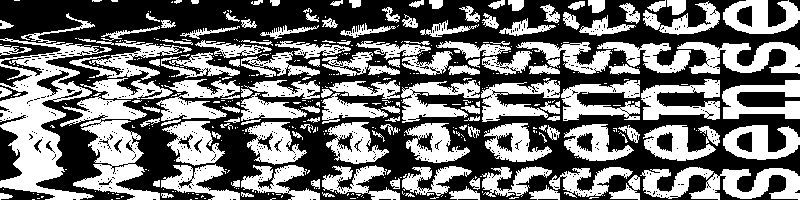

In [96]:
start_im = Image.open('img/vibration_05.jpg')
im = mk_deformation_image(start_im, end_im, n_steps=10, kind='vertical')
im.transpose(2).resize((800, 200))

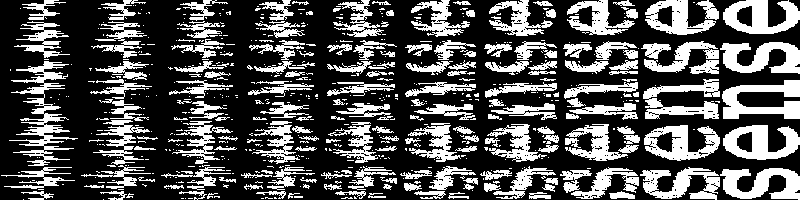

In [97]:
start_im = Image.open('img/waveform_01.png')
im = mk_deformation_image(start_im, end_im, n_steps=10, kind='vertical')
im.transpose(2).resize((800, 200))

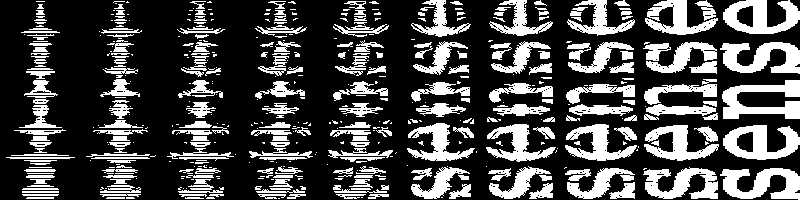

In [98]:
start_im = Image.open('img/waveform_02.jpeg') #.resize((100, 300))
start_im = boolean_matrix_of_image(start_im, cutoff=0.9)
start_im = image_from_matrix(start_im)
start_im = ImageOps.invert(start_im)
im = mk_deformation_image(start_im, end_im, n_steps=10, kind='vertical')
im.transpose(2).resize((800, 200))

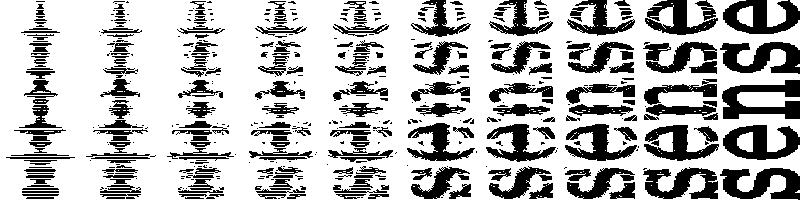

In [99]:
start_im = Image.open('img/waveform_02.jpeg') #.resize((100, 300))
start_im = boolean_matrix_of_image(start_im, cutoff=0.9)
start_im = image_from_matrix(start_im)
start_im = ImageOps.invert(start_im)
im = mk_deformation_image(start_im, end_im, n_steps=10, kind='vertical')
ImageOps.invert(im.transpose(2).resize((800, 200)))

In [35]:
start_im = Image.open('img/vibration_05.jpg').resize((400, 200))
f = 'waveform_to_sense.gif'
mk_gif_of_deformations(start_im, end_im, n_steps=20, 
                               save_to_file=f, coordinate_mapping_maker='knn1')
display_gif(f)  

# Use to filter image

## Choose a filter

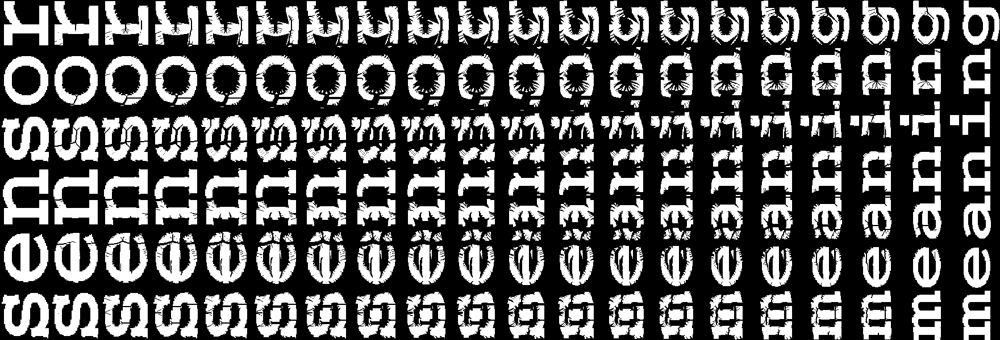

In [11]:
fit_to_size = 400
start_im = image_of_text('sensor').rotate(90, expand=1)
end_im = image_of_text('meaning').rotate(90, expand=1)
im = mk_deformation_image(start_im, end_im, 20)
im

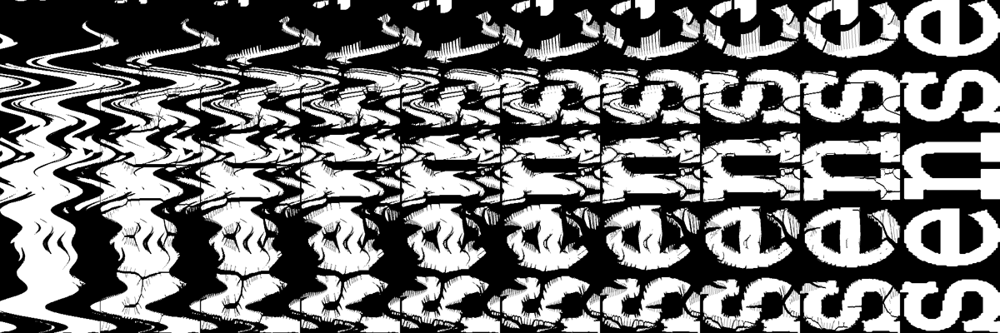

In [8]:
start_im = Image.open('img/vibration_05.jpg')
end_im = image_of_text('sense')
im = mk_deformation_image(start_im, end_im, n_steps=10, kind='vertical')
im = im.transpose(2).resize((1200, 400))
im

# Blending with a background

## Where you need to pad one of the images to match sizes

### Choose foreground

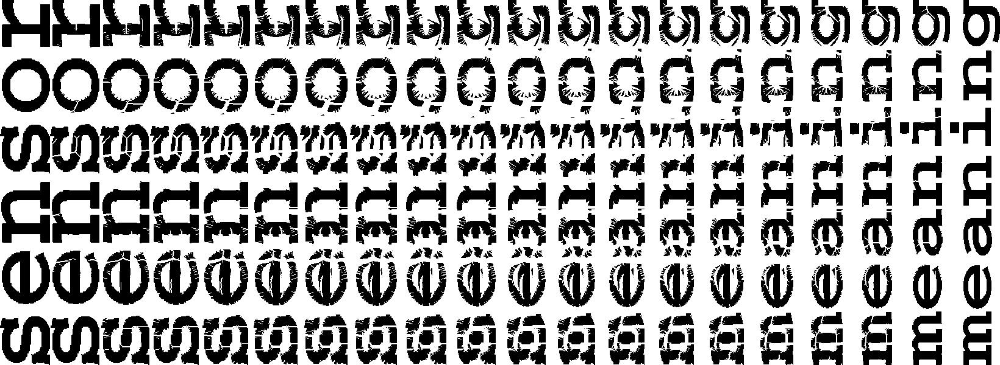

In [64]:
import PIL.ImageOps

fit_to_size = 400
start_im = image_of_text('sensor').rotate(90, expand=1)
end_im = image_of_text('meaning').rotate(90, expand=1)
im = mk_deformation_image(start_im, end_im, 20)
im = PIL.ImageOps.invert(im)
im

### Choose a background

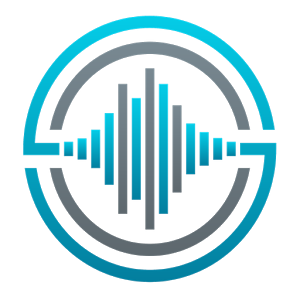

In [103]:
background = Image.open('img/OtoSense logo.png')
# background = background.resize(im.size)
background

### pad it

In [104]:
background.size

(300, 300)

In [105]:
background = background.resize((500, 500))

In [106]:
size_diff = ((np.array(im.size) - np.array(background.size)) / 2).astype(int)
size_diff

array([570,  50])

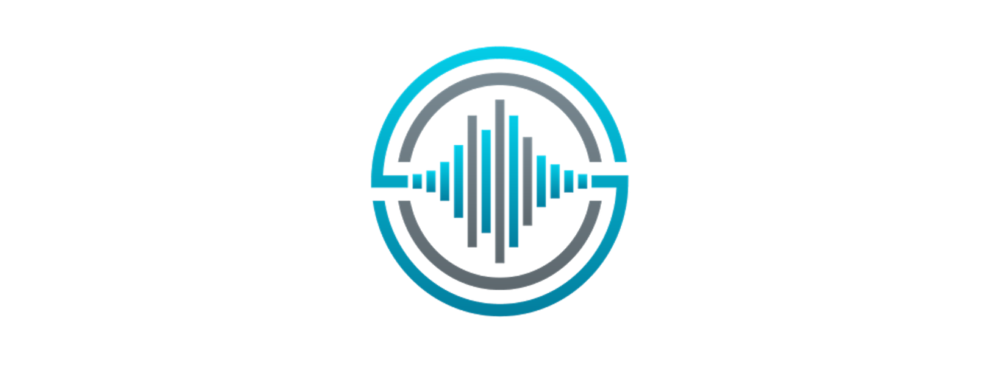

In [107]:
background = add_margin(
    background, size_diff[1], size_diff[0], size_diff[1], size_diff[0], tuple([255] * 3))

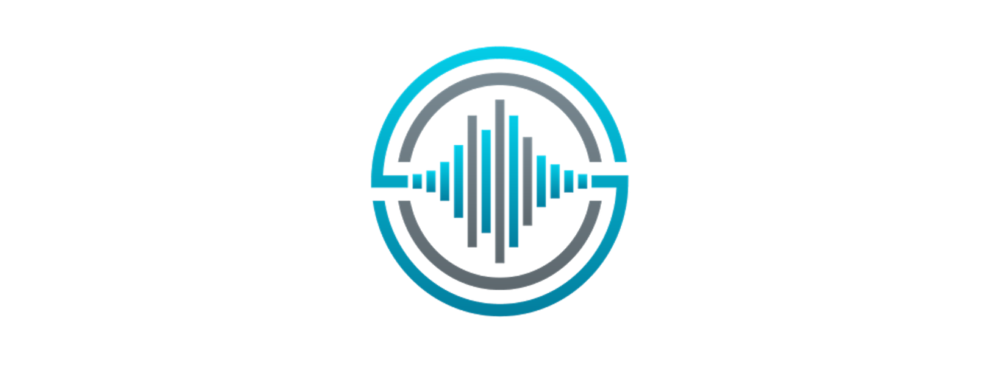

In [146]:
background

### Blend it

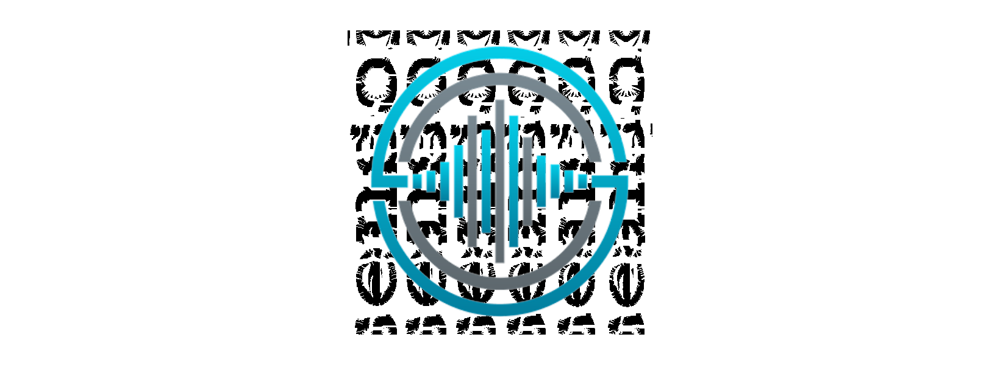

In [205]:
image_copy = im.copy().convert("RGBA")
image_copy.paste(background.convert("RGBA"), (0,0), background)
image_copy

In [163]:
def add_alpha(img, alpha=100, filt=None):
    filt = filt or (lambda x: True)
    img = img.copy().convert("RGBA")
    datas = img.getdata()

    newData = []
    for item in datas:
        if filt(item):
            r, g, b, _ = item
            newData.append((r, g, b, alpha))
        else:
            newData.append(item)
    img.putdata(newData)
    return img


In [188]:
bb = add_alpha(background, 0, lambda item: tuple(item[:2]) == (0, 0, 0))

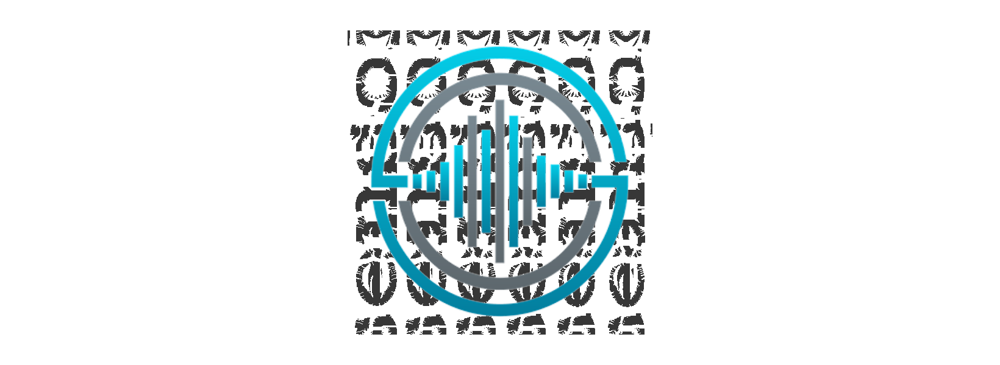

In [180]:
t = add_alpha(im, 200)
tt = add_alpha(background, 200, lambda item: tuple(item[:2]) == (0, 0, 0))
image_copy = t.copy()
image_copy.paste(tt, (0,0), tt)
image_copy

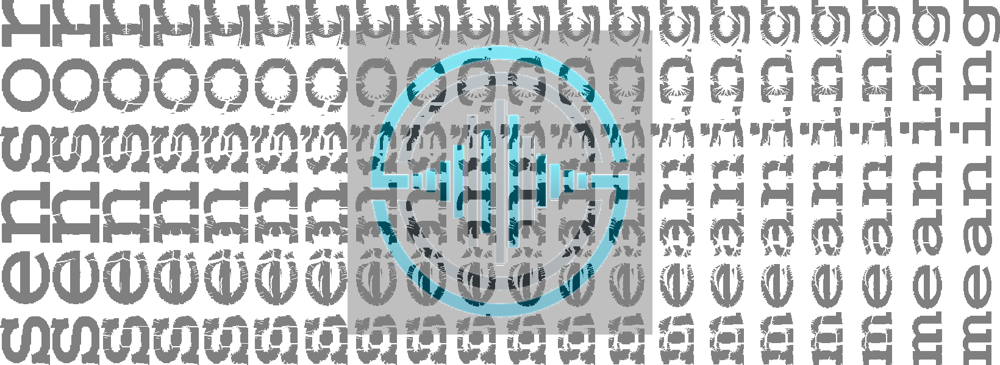

In [191]:
Image.blend(im.convert("RGBA"), bb.convert("RGBA"), 0.5)

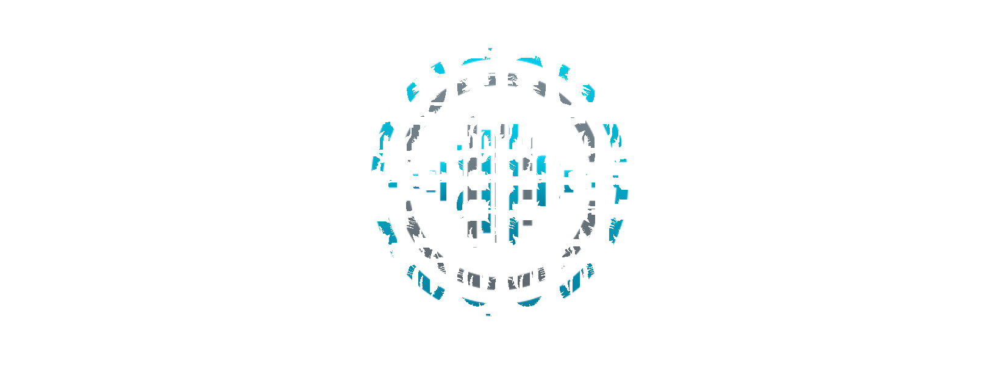

In [117]:
image_copy = img.copy()
image_copy.paste(im, (0,0), im)
image_copy

## Where you need to resize an image

### Choose foreground

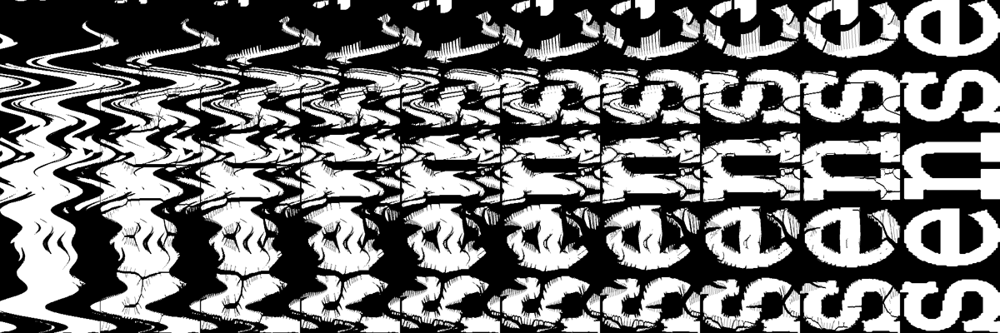

In [41]:
start_im = Image.open('img/vibration_05.jpg')
end_im = image_of_text('sense')
im = mk_deformation_image(start_im, end_im, n_steps=10, kind='vertical')
im = im.transpose(2).resize((1200, 400))
im

### Choose a background

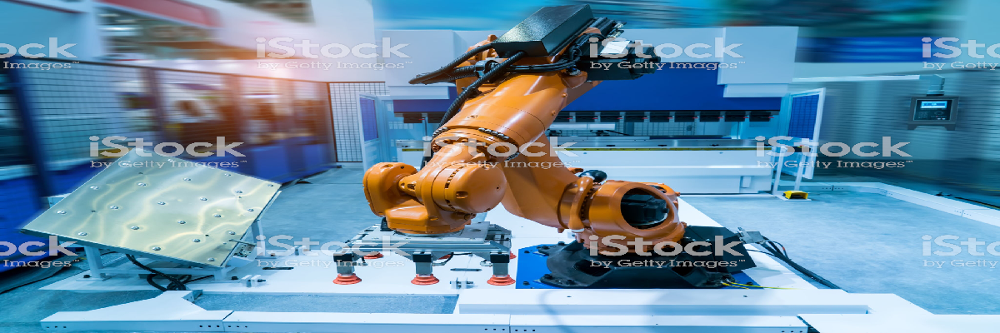

In [104]:
background = Image.open('img/istockphoto-891253498-2048x2048.jpg')
background = Image.open('img/istockphoto-942488342-2048x2048.jpg')
background = background.resize(im.size)
background

### Blend it

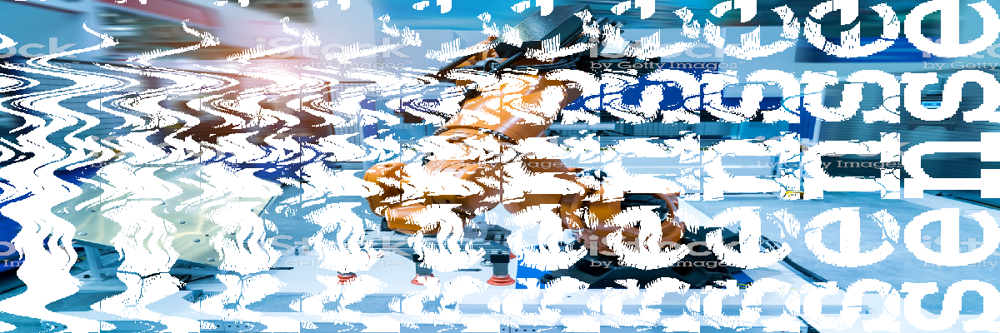

In [105]:
image_copy = background.copy()
image_copy.paste(im, (0,0), im)
image_copy

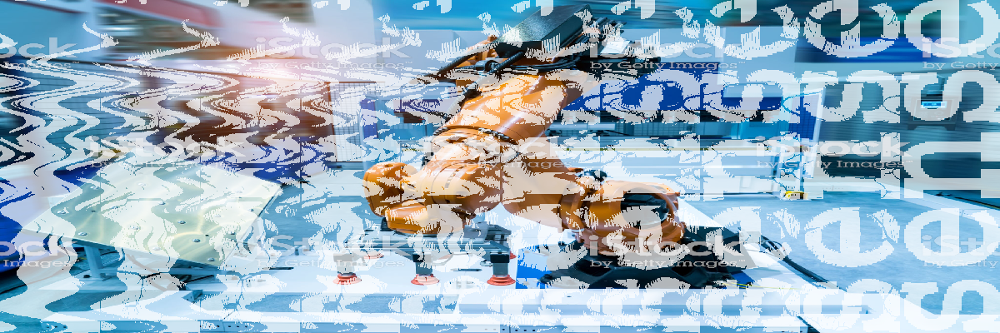

In [106]:
Image.blend(image_copy.convert('RGBA'), background.convert('RGBA'), 0.3)

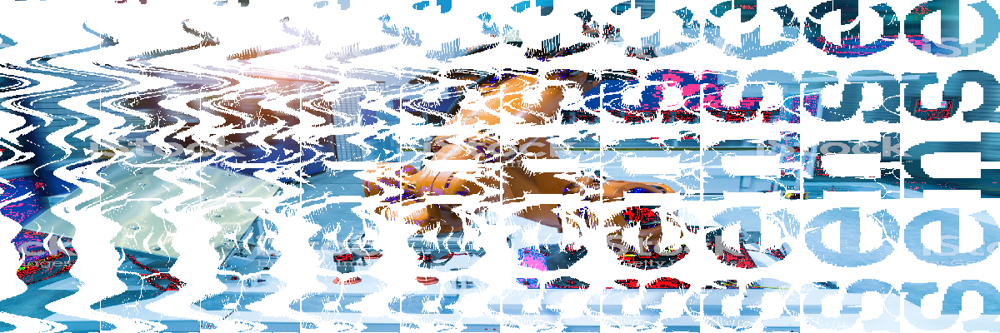

In [107]:
m = np.array(im)
b = np.array(background)
b[m == 0] = 0
mb = ImageOps.invert(image_from_matrix(b))
mb

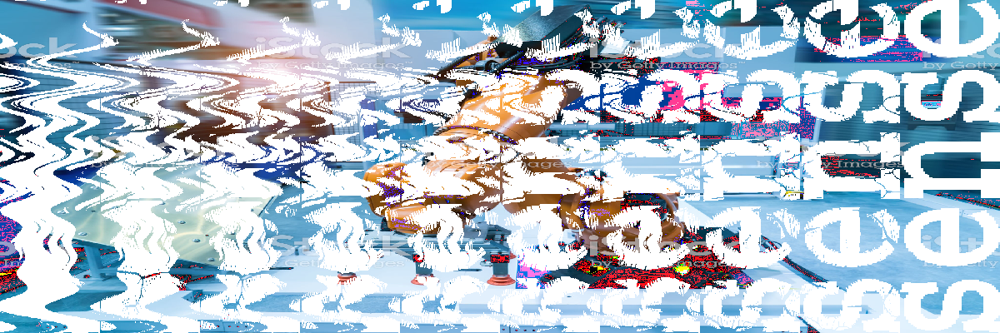

In [108]:
m = np.array(im)
m = ~m
b = np.array(background)
b[m == 0] = 0
mbb = ImageOps.invert(image_from_matrix(b))
mbb

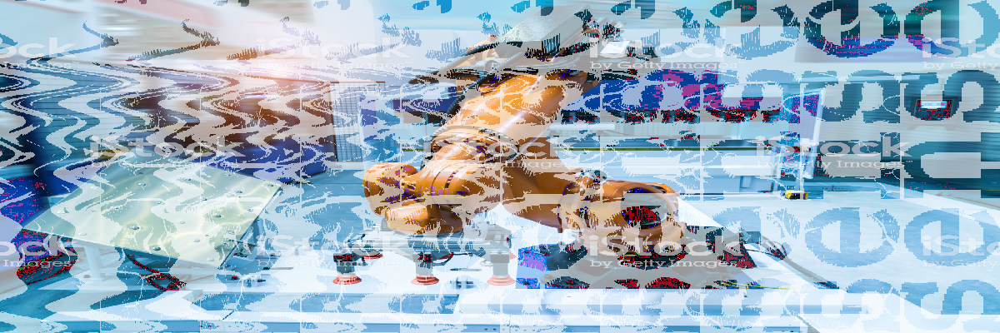

In [109]:
Image.blend(mb.convert('RGBA'), background.convert('RGBA'), 0.4)

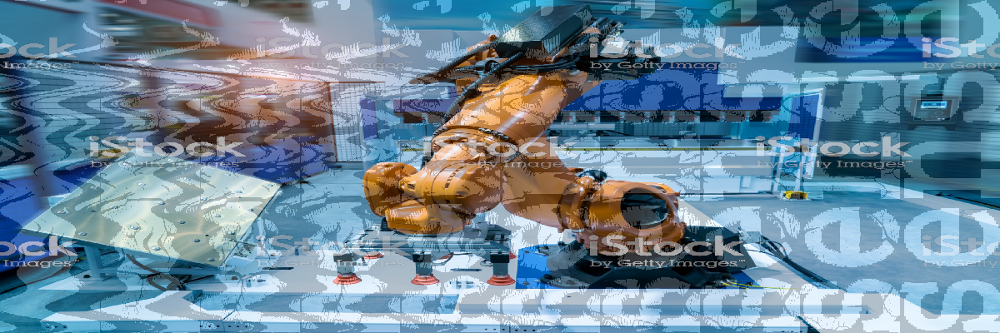

In [111]:
Image.blend(im.convert('RGBA'), background.convert('RGBA'), 0.8)

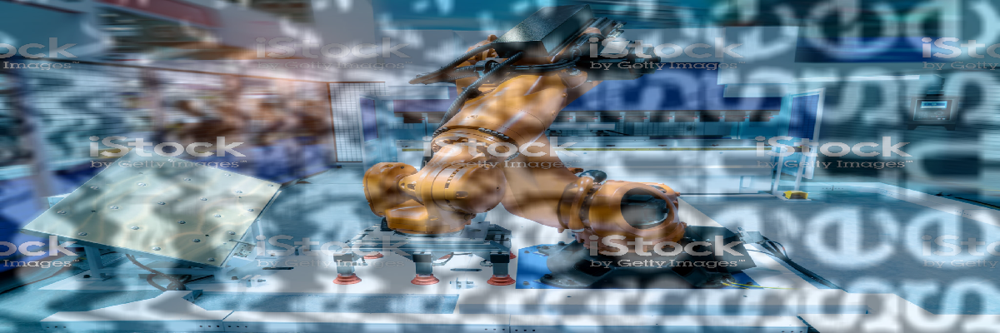

In [116]:
Image.blend(ImageOps.box_blur(im.convert('RGBA'), 5), background.convert('RGBA'), 0.6)

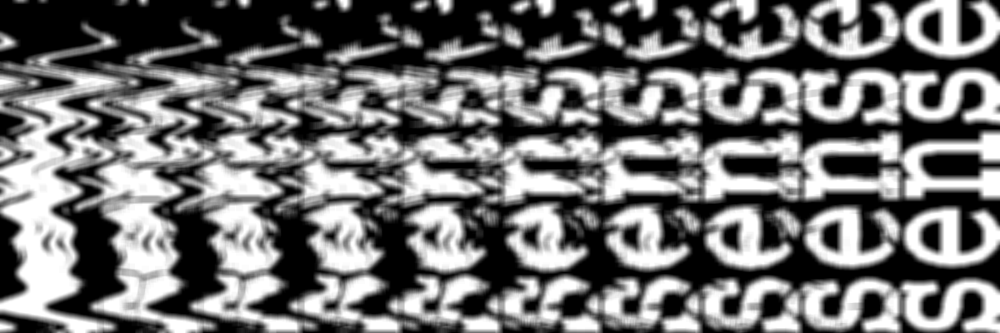

In [118]:
ImageOps.box_blur(im, 4)

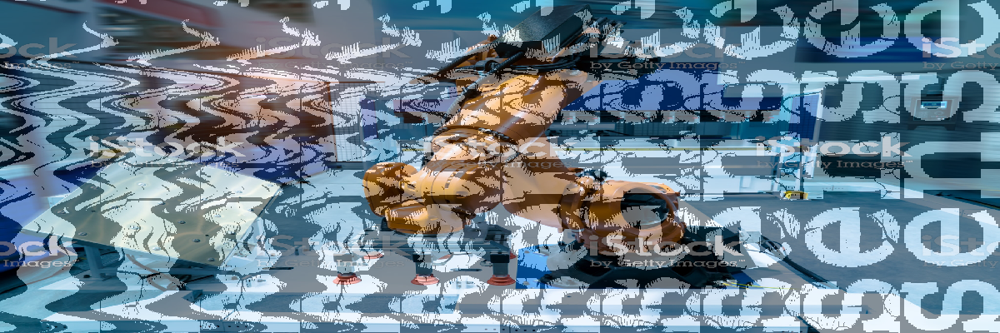

In [123]:
overlayed_image = overlay(background_im=background, overlay_im=im, alpha=0.4)
overlayed_image

# Scrap